<a href="https://colab.research.google.com/github/precious95/precious/blob/main/Copy_of_dust7_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_14012/632701315.py:123: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_14012/632701315.py:123: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_14012/632701315.py:123: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_14012/632701315.p

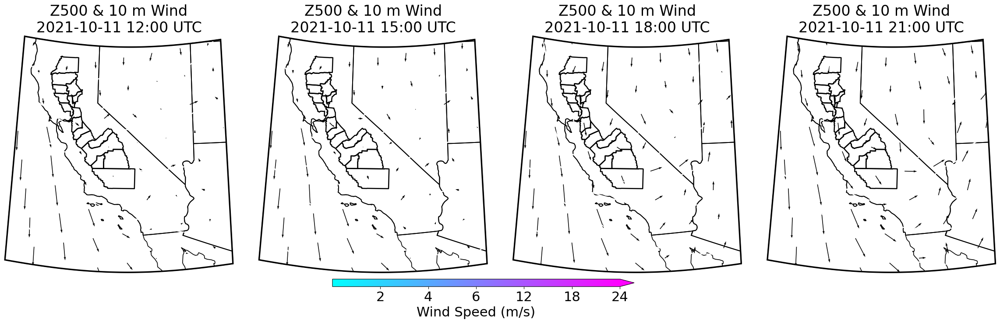

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import TwoSlopeNorm
import geopandas as gpd
import metpy.calc as mpcalc
from herbie import Herbie
from shapely.vectorized import contains  # For masking

# -----------------------------------------------------------------------------
# 0) Load Central Valley counties
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_counties.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Load California boundary from Natural Earth
# -----------------------------------------------------------------------------
shpfile = shapereader.natural_earth(
    resolution="50m", category="cultural",
    name="admin_1_states_provinces"
)
reader = shapereader.Reader(shpfile)
CA_geom = None
for rec in reader.records():
    if rec.attributes["name"] == "California":
        CA_geom = rec.geometry
        break
if CA_geom is None:
    raise RuntimeError("Could not find California geometry")

# -----------------------------------------------------------------------------
# 2) Build concave "pinched" California frame
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f = np.linspace(0, 1, n)
amp_top, amp_bot = 0.28, 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top * np.sin(np.pi * f)))
right  = np.column_stack(([lon1]*n, np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot * np.sin(np.pi * f)))
left   = np.column_stack(([lon0]*n, np.linspace(lat0, lat1, n)))
pts    = np.vstack([top, right, bottom, left, top[:1]])
codes  = [Path.MOVETO] + [Path.LINETO] * (len(pts)-2) + [Path.CLOSEPOLY]
box_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(box_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        box_path,
        transform=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor=edgecolor,
        linewidth=linewidth,
        zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 3) Define event times and fetch 500 mb geopotential + wind data
# -----------------------------------------------------------------------------
times_2021 = ["2021-10-11 12:00", "2021-10-11 15:00", "2021-10-11 18:00", "2021-10-11 21:00"]
level = 500
data_events = []
for ts in times_2021:
    H = Herbie(ts, model="rap", product="awp130pgrb")
    ds_z = H.xarray(f":HGT:{level} mb:")
    z = ds_z["gh"].metpy.quantify().metpy.dequantify().values
    ds_uv = H.xarray("[UV]GRD:10 m above ground:")
    u10_da = ds_uv["u10"].metpy.quantify()
    v10_da = ds_uv["v10"].metpy.quantify()
    wspd_da = mpcalc.wind_speed(u10_da, v10_da)
    wspd = wspd_da.metpy.dequantify().values
    u10 = u10_da.metpy.dequantify().values
    v10 = v10_da.metpy.dequantify().values
    data_events.append({
        "ts": ts,
        "z": z,
        "u10": u10,
        "v10": v10,
        "wspd": wspd,
        "lons": ds_z["longitude"].values,
        "lats": ds_z["latitude"].values
    })

# -----------------------------------------------------------------------------
# 4) Wind-speed colormap and norm
# -----------------------------------------------------------------------------
vmin, vmax = 0.0, 24.0
threshold = 6.0
norm = TwoSlopeNorm(vmin=vmin, vcenter=threshold, vmax=vmax)
cmap = plt.get_cmap("cool")
levels_w = np.linspace(vmin, vmax, 21)

# -----------------------------------------------------------------------------
# 5) Plot 1×4 panel for 500 mb
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    1, 4, figsize=(24, 7),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(wspace=0.03, left=0.02, right=0.98, top=0.90, bottom=0.08)

for ax, dat in zip(axs, data_events):
    clip_to_curve(ax)
    ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1.2)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=1.4)
    ax.add_feature(cfeature.BORDERS, linewidth=1.4)

    # Mask only wind-speed contour outside California (invert contains mask)
    lon2d, lat2d = np.meshgrid(dat["lons"], dat["lats"]) if dat["lons"].ndim==1 else (dat["lons"], dat["lats"])
    inside = contains(CA_geom, lon2d, lat2d)
    wspd_masked = np.where(inside, dat["wspd"], np.nan)

    cf = ax.contourf(
        lon2d, lat2d, wspd_masked,
        levels=levels_w, norm=norm, cmap=cmap,
        transform=ccrs.PlateCarree(), extend="both"
    )

    # Geopotential contours unchanged
    interval = 60
    start = (np.nanmin(dat["z"]) // interval) * interval
    end = (np.nanmax(dat["z"]) // interval) * interval + interval
    levs_z = np.arange(start, end, interval)
    ax.contour(
        dat["lons"], dat["lats"], dat["z"],
        levels=levs_z, colors="white", linewidths=1.7,
        transform=ccrs.PlateCarree()
    )

    # Quivers unchanged
    step = 12
    ax.quiver(
        dat["lons"][::step, ::step],
        dat["lats"][::step, ::step],
        dat["u10"][::step, ::step],
        dat["v10"][::step, ::step],
        color="black", transform=ccrs.PlateCarree(),
        scale=180, width=0.003
    )

    ax.add_geometries(
        cv.geometry, crs=ccrs.PlateCarree(),
        edgecolor="black", facecolor="none",
        linewidth=1.8, zorder=5
    )

    ax.set_title(f"Z500 & 10 m Wind\n{dat['ts']} UTC", fontsize=24)
    ax.tick_params(labelsize=28)

# -----------------------------------------------------------------------------
# 6) Shared colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs, orientation="horizontal",
    fraction=0.03, pad=0.06, aspect=40, extend="max"
)
cbar.set_ticks([2, 4, 6, 12, 18, 24])
cbar.set_label("Wind Speed (m/s)", fontsize=22)
cbar.ax.tick_params(labelsize=22)

# -----------------------------------------------------------------------------
# 7) Save & show
# -----------------------------------------------------------------------------
plt.savefig("rap5_z500_2021_pinched_CA_500mb.png", dpi=300, bbox_inches="tight")
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 03:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


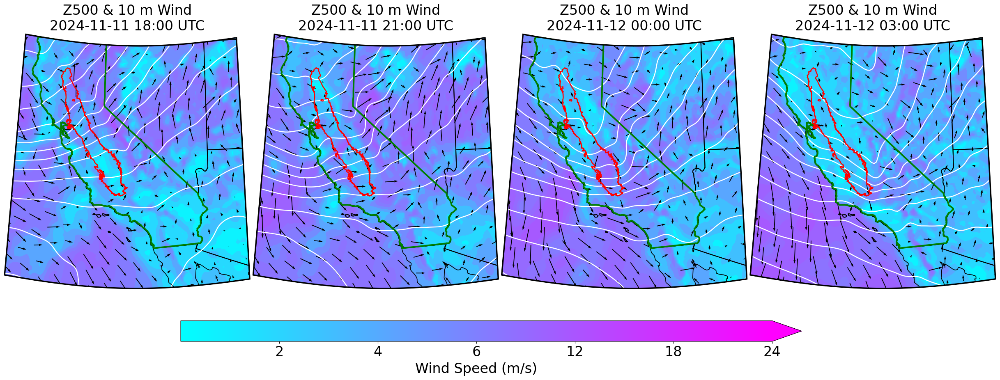

In [ ]:
from herbie import Herbie
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import TwoSlopeNorm
import geopandas as gpd
import metpy.calc as mpcalc

# -----------------------------------------------------------------------------
# 0) Load Central Valley counties
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_counties.shp")
cv1 = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)
cv2 = gpd.read_file("california_shapefile.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Define the November event times
# -----------------------------------------------------------------------------
times = [
    "2024-11-11 18:00",
    "2024-11-11 21:00",
    "2024-11-12 00:00",
    "2024-11-12 03:00",
]

# -----------------------------------------------------------------------------
# 2) Fetch geopotential & 10 m winds at 500 mb only
# -----------------------------------------------------------------------------
level = 500
data_events = []
for ts in times:
    H    = Herbie(ts, model="rap", product="awp130pgrb")
    ds_z = H.xarray(f":HGT:{level} mb:")
    zlev = ds_z["gh"].metpy.quantify().metpy.dequantify().values

    ds_uv = H.xarray(":[UV]GRD:10 m above ground:")
    u10_da = ds_uv["u10"].metpy.quantify()
    v10_da = ds_uv["v10"].metpy.quantify()
    wspd = mpcalc.wind_speed(u10_da, v10_da).metpy.dequantify().values

    data_events.append({
        "ts":   ts,
        "z":    zlev,
        "u10":  u10_da.metpy.dequantify().values,
        "v10":  v10_da.metpy.dequantify().values,
        "wspd": wspd,
        "lons": ds_z["longitude"].values,
        "lats": ds_z["latitude"].values
    })

# -----------------------------------------------------------------------------
# 3) Build concave “pinched” California frame (unchanged)
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f = np.linspace(0, 1, n)
amp_top = 0.28
amp_bot = 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top*np.sin(np.pi*f)))
right  = np.column_stack(([lon1]*n, np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot*np.sin(np.pi*f)))
left   = np.column_stack(([lon0]*n, np.linspace(lat0, lat1, n)))

pts = np.vstack([top, right, bottom, left, top[:1]])
codes = [Path.MOVETO] + [Path.LINETO]*(len(pts)-2) + [Path.CLOSEPOLY]
box_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(box_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        box_path,
        transform=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor=edgecolor,
        linewidth=linewidth,
        zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 4) Define fixed wind-speed norm & colormap centered at 6 m/s
# -----------------------------------------------------------------------------
vmin, vmax = 0.0, 24.0
threshold  = 6.0
norm       = TwoSlopeNorm(vmin=vmin, vcenter=threshold, vmax=vmax)
cmap       = plt.get_cmap("cool")
levels_w   = np.linspace(vmin, vmax, 21)

# -----------------------------------------------------------------------------
# 5) Plot 1×4 panel: 500 mb only
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    1, len(data_events), figsize=(35, 21),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(wspace=0.01, left=0.01, right=0.7, top=0.9, bottom=0.1)

for j, dat in enumerate(data_events):
    ax = axs[j]
    clip_to_curve(ax)
    ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())

    # base features
    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1.2)
    ax.add_feature(cfeature.STATES.with_scale("50m"),   linewidth=1.4)
    ax.add_feature(cfeature.BORDERS, linewidth=1.4)

    # 1) wind-speed filled contours
    cf = ax.contourf(
        dat["lons"], dat["lats"], dat["wspd"],
        levels=levels_w, norm=norm, cmap=cmap,
        transform=ccrs.PlateCarree(), extend="both"
    )

    # 2) geopotential-height contours at 500mb:60m intervals
    interval = 30
    start    = (np.nanmin(dat["z"]) // interval) * interval
    end      = (np.nanmax(dat["z"]) // interval) * interval + interval
    levs_z   = np.arange(start, end, interval)
    ax.contour(
        dat["lons"], dat["lats"], dat["z"],
        levels=levs_z, colors="white", linewidths=1.7,
        transform=ccrs.PlateCarree()
    )

    # 3) 10 m wind quivers every 12th grid point
    step = 6
    ax.quiver(
        dat["lons"][::step, ::step],
        dat["lats"][::step, ::step],
        dat["u10"][::step, ::step],
        dat["v10"][::step, ::step],
        color="black",
        transform=ccrs.PlateCarree(),
        scale=120, width=0.003
    )

    # 4) Central Valley outline
    ax.add_geometries(
        cv1.geometry, crs=ccrs.PlateCarree(),
        edgecolor="red", facecolor="none",
        linewidth=1.8, zorder=5
    )

    ax.add_geometries(
        cv2.geometry, crs=ccrs.PlateCarree(),
        edgecolor="green", facecolor="none",
        linewidth=2.8, zorder=5
    )

    # title
    ax.set_title(
        f"Z{level} & 10 m Wind\n{dat['ts']} UTC",
        fontsize=24, pad=6
    )
    ax.tick_params(labelsize=18)

# -----------------------------------------------------------------------------
# 6) Shared colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs.ravel().tolist(),
    orientation="horizontal",
    fraction=0.03, pad=0.06, aspect=30, extend="max"
)
tick_vals = [2, 4, 6, 12, 18, 24]
cbar.set_ticks(tick_vals)
cbar.set_ticklabels([str(v) for v in tick_vals])
cbar.set_label("Wind Speed (m/s)", fontsize=24, labelpad=6)
cbar.ax.tick_params(labelsize=24)

# save & show
plt.savefig("rap_z500_10m.png", dpi=500, bbox_inches="tight")
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


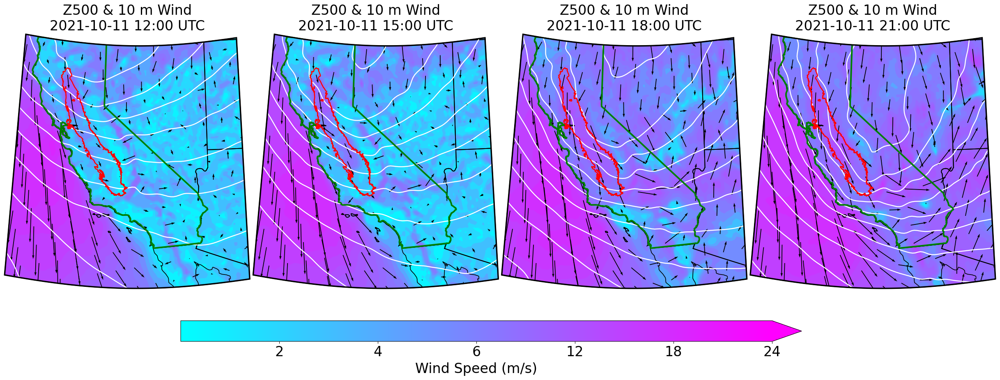

In [ ]:
from herbie import Herbie
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import TwoSlopeNorm
import geopandas as gpd
import metpy.calc as mpcalc

# -----------------------------------------------------------------------------
# 0) Load Central Valley counties
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_counties.shp")
cv1 = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)
cv2 = gpd.read_file("california_shapefile.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Define the November event times
# -----------------------------------------------------------------------------
times = [
    "2021-10-11 12:00",
    "2021-10-11 15:00",
    "2021-10-11 18:00",
    "2021-10-11 21:00",
]

# -----------------------------------------------------------------------------
# 2) Fetch geopotential & 10 m winds at 500 mb only
# -----------------------------------------------------------------------------
level = 500
data_events = []
for ts in times:
    H    = Herbie(ts, model="rap", product="awp130pgrb")
    ds_z = H.xarray(f":HGT:{level} mb:")
    zlev = ds_z["gh"].metpy.quantify().metpy.dequantify().values

    ds_uv = H.xarray(":[UV]GRD:10 m above ground:")
    u10_da = ds_uv["u10"].metpy.quantify()
    v10_da = ds_uv["v10"].metpy.quantify()
    wspd = mpcalc.wind_speed(u10_da, v10_da).metpy.dequantify().values

    data_events.append({
        "ts":   ts,
        "z":    zlev,
        "u10":  u10_da.metpy.dequantify().values,
        "v10":  v10_da.metpy.dequantify().values,
        "wspd": wspd,
        "lons": ds_z["longitude"].values,
        "lats": ds_z["latitude"].values
    })

# -----------------------------------------------------------------------------
# 3) Build concave “pinched” California frame (unchanged)
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f = np.linspace(0, 1, n)
amp_top = 0.28
amp_bot = 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top*np.sin(np.pi*f)))
right  = np.column_stack(([lon1]*n, np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot*np.sin(np.pi*f)))
left   = np.column_stack(([lon0]*n, np.linspace(lat0, lat1, n)))

pts = np.vstack([top, right, bottom, left, top[:1]])
codes = [Path.MOVETO] + [Path.LINETO]*(len(pts)-2) + [Path.CLOSEPOLY]
box_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(box_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        box_path,
        transform=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor=edgecolor,
        linewidth=linewidth,
        zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 4) Define fixed wind-speed norm & colormap centered at 6 m/s
# -----------------------------------------------------------------------------
vmin, vmax = 0.0, 24.0
threshold  = 6.0
norm       = TwoSlopeNorm(vmin=vmin, vcenter=threshold, vmax=vmax)
cmap       = plt.get_cmap("cool")
levels_w   = np.linspace(vmin, vmax, 21)

# -----------------------------------------------------------------------------
# 5) Plot 1×4 panel: 500 mb only
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    1, len(data_events), figsize=(35, 21),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(wspace=0.01, left=0.01, right=0.7, top=0.9, bottom=0.1)

for j, dat in enumerate(data_events):
    ax = axs[j]
    clip_to_curve(ax)
    ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())

    # base features
    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1.2)
    ax.add_feature(cfeature.STATES.with_scale("50m"),   linewidth=1.4)
    ax.add_feature(cfeature.BORDERS, linewidth=1.4)

    # 1) wind-speed filled contours
    cf = ax.contourf(
        dat["lons"], dat["lats"], dat["wspd"],
        levels=levels_w, norm=norm, cmap=cmap,
        transform=ccrs.PlateCarree(), extend="both"
    )

    # 2) geopotential-height contours at 500mb:60m intervals
    interval = 40
    start    = (np.nanmin(dat["z"]) // interval) * interval
    end      = (np.nanmax(dat["z"]) // interval) * interval + interval
    levs_z   = np.arange(start, end, interval)
    ax.contour(
        dat["lons"], dat["lats"], dat["z"],
        levels=levs_z, colors="white", linewidths=1.7,
        transform=ccrs.PlateCarree()
    )

    # 3) 10 m wind quivers every 12th grid point
    step = 7
    ax.quiver(
        dat["lons"][::step, ::step],
        dat["lats"][::step, ::step],
        dat["u10"][::step, ::step],
        dat["v10"][::step, ::step],
        color="black",
        transform=ccrs.PlateCarree(),
        scale=120, width=0.003
    )

    # 4) Central Valley outline
    ax.add_geometries(
        cv1.geometry, crs=ccrs.PlateCarree(),
        edgecolor="red", facecolor="none",
        linewidth=1.8, zorder=5
    )

    ax.add_geometries(
        cv2.geometry, crs=ccrs.PlateCarree(),
        edgecolor="green", facecolor="none",
        linewidth=2.8, zorder=5
    )

    # title
    ax.set_title(
        f"Z{level} & 10 m Wind\n{dat['ts']} UTC",
        fontsize=24, pad=6
    )
    ax.tick_params(labelsize=18)

# -----------------------------------------------------------------------------
# 6) Shared colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs.ravel().tolist(),
    orientation="horizontal",
    fraction=0.03, pad=0.06, aspect=30, extend="max"
)
tick_vals = [2, 4, 6, 12, 18, 24]
cbar.set_ticks(tick_vals)
cbar.set_ticklabels([str(v) for v in tick_vals])
cbar.set_label("Wind Speed (m/s)", fontsize=24, labelpad=6)
cbar.ax.tick_params(labelsize=24)

# save & show
plt.savefig("rap_z500_2021_10m.png", dpi=500, bbox_inches="tight")
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 03:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/1253319300.py:157: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/1253319300.py:157: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/1253319300.py:157: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196

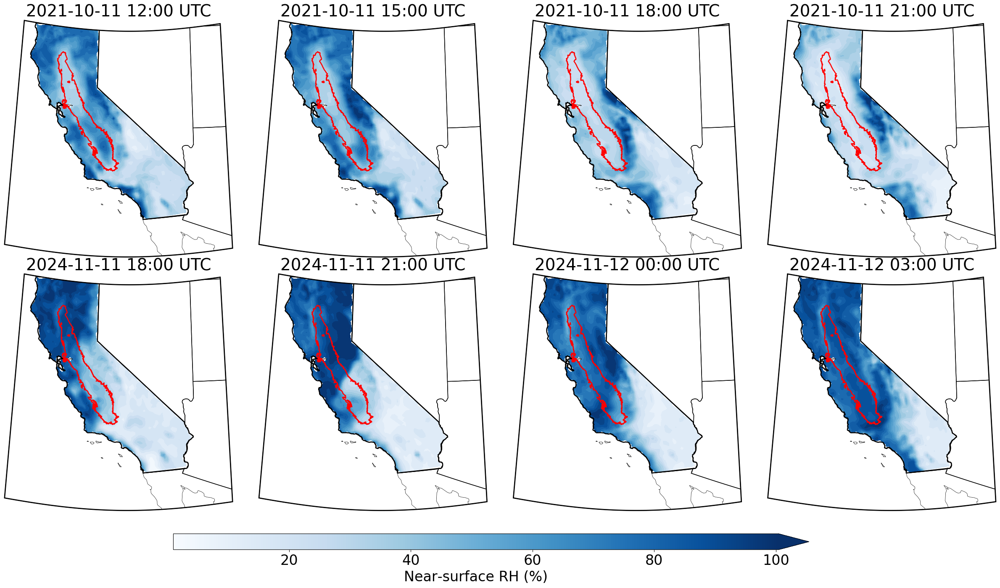

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

import geopandas as gpd
from herbie import Herbie

# -----------------------------------------------------------------------------
# 0) Load Central Valley shapefile (for drawing county outlines in red)
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)
cv1 = gpd.read_file("california_shapefile.shp").to_crs(epsg=4326)
cv2 = gpd.read_file("central_valley_counties.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Load the California state boundary (Natural Earth admin_1_states)
# -----------------------------------------------------------------------------
shpfilename = shapereader.natural_earth(
    resolution="50m",
    category="cultural",
    name="admin_1_states_provinces",
)
reader = shapereader.Reader(shpfilename)
CA_geom = None
for record in reader.records():
    if record.attributes["name"] == "California":
        CA_geom = record.geometry
        break
if CA_geom is None:
    raise RuntimeError("Could not find a Natural Earth record for California!")

# -----------------------------------------------------------------------------
# 2) Define curved "pinched" California frame (unchanged)
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f      = np.linspace(0, 1, n)
amp_top = 0.28
amp_bot = 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n),
                          lat1 - amp_top * np.sin(np.pi * f)))
right  = np.column_stack(([lon1] * n, np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n),
                          lat0 - amp_bot * np.sin(np.pi * f)))
left   = np.column_stack(([lon0] * n, np.linspace(lat0, lat1, n)))
pts    = np.vstack([top, right, bottom, left, top[:1]])
codes  = [Path.MOVETO] + [Path.LINETO] * (len(pts) - 2) + [Path.CLOSEPOLY]
frame_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=5, edgecolor="black", zorder=10):
    ax.set_boundary(frame_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        frame_path,
        transform=ccrs.PlateCarree(),
        facecolor="none",
        edgecolor=edgecolor,
        linewidth=linewidth,
        zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 3) Define event times and fetch RAP RH via Herbie
# -----------------------------------------------------------------------------
times_2021 = [
    "2021-10-11 12:00",
    "2021-10-11 15:00",
    "2021-10-11 18:00",
    "2021-10-11 21:00",
]
times_2024 = [
    "2024-11-11 18:00",
    "2024-11-11 21:00",
    "2024-11-12 00:00",
    "2024-11-12 03:00",
]

data_events = []
gmin, gmax = np.inf, -np.inf
for label, times in [("Oct 2021", times_2021), ("Nov 2024", times_2024)]:
    arrs = []
    for ts in times:
        ds = Herbie(ts, model="rap", product="awp130pgrb").xarray(":RH:2 m above ground:")
        rh = ds["r2"].metpy.quantify().metpy.dequantify().values
        lons = ds["longitude"].values
        lats = ds["latitude"].values

        mn, mx = np.nanmin(rh), np.nanmax(rh)
        gmin, gmax = min(gmin, mn), max(gmax, mx)

        arrs.append({"ts": ts, "rh": rh, "lons": lons, "lats": lats})
    data_events.append((label, arrs))

# -----------------------------------------------------------------------------
# 4) Plot 2×4 grid, masking ocean and zero‐out outside California
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117,
    central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    2, 4, figsize=(35, 14),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(
    wspace=0.01, hspace=0.11,
    left=0.01, right=0.7, top=1, bottom=0.1
)

levels = np.linspace(gmin, gmax, 21)
norm = Normalize(vmin=gmin, vmax=gmax)

# Import shapely.vectorized.contains to build the CA mask:
from shapely.vectorized import contains

for i, (label, arrs) in enumerate(data_events):
    for j, data in enumerate(arrs):
        ax = axs[i, j]
        clip_to_curve(ax, linewidth=3)
        ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())

        # Plot coastlines, states, and borders for context:
        ax.add_feature(cfeature.COASTLINE.with_scale("50m"), lw=1)
        ax.add_feature(cfeature.STATES.with_scale("50m"),   lw=1)
        ax.add_feature(cfeature.BORDERS,                    lw=1)

        # Build a 2D lon/lat grid:
        if data["lons"].ndim == 1 and data["lats"].ndim == 1:
            lon2d, lat2d = np.meshgrid(data["lons"], data["lats"])
        else:
            lon2d, lat2d = data["lons"], data["lats"]

        # ---------------------------------------------------------------------
        # 4a) REMAP RAP longitudes from [0,360] → [-180,180], if needed:
        # ---------------------------------------------------------------------
        if lon2d.max() > 180:
            lon2d = np.where(lon2d > 180, lon2d - 360, lon2d)

        # Copy the RH array so we don't alter the original:
        rh = data["rh"].copy()

        # ---------------------------------------------------------------------
        # 4b) Build a boolean mask: True where (lon,lat) lies inside CA_geom
        # ---------------------------------------------------------------------
        inside_ca = contains(CA_geom, lon2d, lat2d)

        # ---------------------------------------------------------------------
        # 4c) Zero‐out any RH value where the point is outside California
        # ---------------------------------------------------------------------
        rh[~inside_ca] = np.nan

        # ---------------------------------------------------------------------
        # 4d) Now plot RH with zeros outside CA:
        # ---------------------------------------------------------------------
        cf = ax.contourf(
            lon2d, lat2d, rh,
            levels=levels, norm=norm, cmap="Blues",
            extend="both", transform=ccrs.PlateCarree(),
            zorder=1
        )

        # Mask the ocean on top (white) so land RH shows clearly:
        ax.add_feature(
            cfeature.OCEAN.with_scale("50m"),
            facecolor="white", zorder=2
        )

        # Overlay Central Valley counties in red
        ax.add_geometries(
            cv.geometry, crs=ccrs.PlateCarree(),
            edgecolor="red", facecolor="none", lw=1.8, zorder=3
        )

        # Overlay Central Valley counties in red
        ax.add_geometries(
            cv1.geometry, crs=ccrs.PlateCarree(),
            edgecolor="black", facecolor="none", lw=1.8, zorder=3
        )

        #ax.add_geometries(
         #   cv2.geometry, crs=ccrs.PlateCarree(),
          #  edgecolor="grey", facecolor="none", lw=1.8, zorder=3
        #)


        ax.set_title(f"{data['ts']} UTC", fontsize=28,fontweight="normal", pad=6)
        ax.tick_params(labelsize=28)

# -----------------------------------------------------------------------------
# 5) Shared horizontal colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap="Blues")
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs.ravel().tolist(),
    orientation="horizontal",
    fraction=0.03, pad=0.06,
    aspect=40, extend="max"
)
cbar.set_label("Near‐surface RH (%)", fontsize=24)
cbar.ax.tick_params(labelsize=24)

# -----------------------------------------------------------------------------
# 6) Save & show
# -----------------------------------------------------------------------------
plt.suptitle("", fontsize=24, y=0.99)
plt.savefig("rap_rh.png", dpi=500, bbox_inches="tight")
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 03:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3947229096.py:146: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3947229096.py:146: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3947229096.py:146: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196

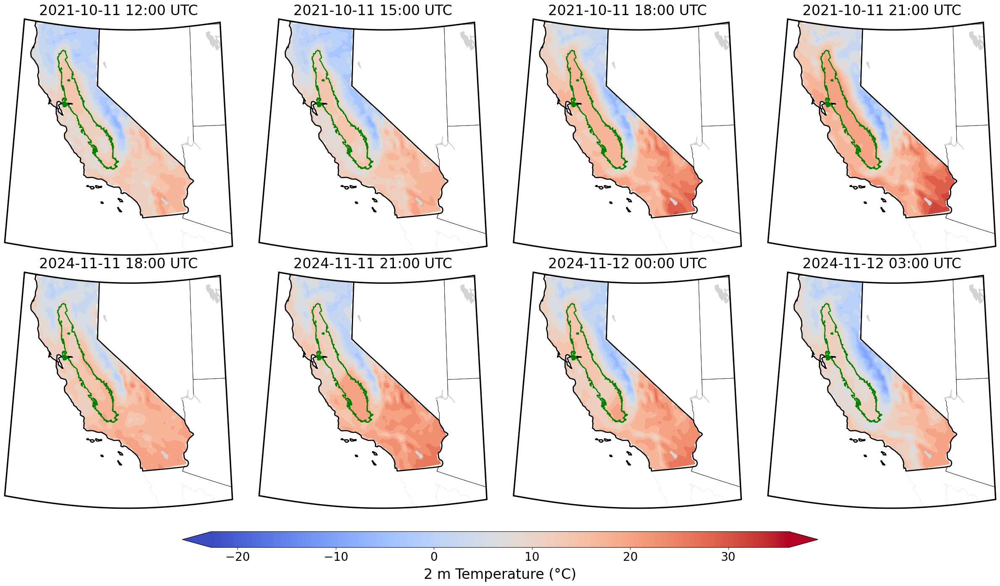

In [ ]:
from herbie import Herbie
import numpy as np
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

import geopandas as gpd
from shapely.vectorized import contains            # ← import here
from metpy.units import units

# -----------------------------------------------------------------------------
# 0) Load Central Valley shapefile (for CV county outlines in green)
# -----------------------------------------------------------------------------

cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Load California boundary from Natural Earth (for CA outline in black)
# -----------------------------------------------------------------------------
shpfile = shapereader.natural_earth(
    resolution="50m", category="cultural",
    name="admin_1_states_provinces"
)
reader = shapereader.Reader(shpfile)
CA_geom = None
for rec in reader.records():
    if rec.attributes["name"] == "California":
        CA_geom = rec.geometry
        break
if CA_geom is None:
    raise RuntimeError("Could not find California in Natural Earth admin_1_states_provinces")

# -----------------------------------------------------------------------------
# 2) Define your two event lists
# -----------------------------------------------------------------------------
times_2021 = ["2021-10-11 12:00", "2021-10-11 15:00",
               "2021-10-11 18:00", "2021-10-11 21:00"]
times_2024 = ["2024-11-11 18:00", "2024-11-11 21:00",
               "2024-11-12 00:00", "2024-11-12 03:00"]
all_events = [("Oct 2021", times_2021),
              ("Nov 2024", times_2024)]

# -----------------------------------------------------------------------------
# 3) Fetch 2 m temperature, convert to °C, track global vmin/vmax
# -----------------------------------------------------------------------------
data_events = []
gmin, gmax = np.inf, -np.inf

for label, ts_list in all_events:
    arrs = []
    for ts in ts_list:
        H       = Herbie(ts, model="rap", product="awp130pgrb")
        ds_temp = H.xarray(":TMP:2 m above ground:").metpy.parse_cf()
        t2k     = ds_temp["t2m"].metpy.quantify()
        t2c     = t2k.metpy.convert_units("degC").metpy.dequantify().values

        lons = ds_temp["longitude"].values
        lats = ds_temp["latitude"].values

        gmin = min(gmin, float(np.nanmin(t2c)))
        gmax = max(gmax, float(np.nanmax(t2c)))

        arrs.append({"ts": ts, "temp": t2c, "lons": lons, "lats": lats})
    data_events.append((label, arrs))

# -----------------------------------------------------------------------------
# 4) Build the “pinched” California frame (unchanged)
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f          = np.linspace(0, 1, n)
amp_top    = 0.28
amp_bot    = 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n),
                          lat1 - amp_top * np.sin(np.pi * f)))
right  = np.column_stack(([lon1]*n,
                          np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n),
                          lat0 - amp_bot * np.sin(np.pi * f)))
left   = np.column_stack(([lon0]*n,
                          np.linspace(lat0, lat1, n)))
pts    = np.vstack([top, right, bottom, left, top[:1]])
codes  = [Path.MOVETO] + [Path.LINETO]*(len(pts)-2) + [Path.CLOSEPOLY]
frame_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(frame_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        frame_path, transform=ccrs.PlateCarree(),
        facecolor="none", edgecolor=edgecolor,
        linewidth=linewidth, zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 5) Plot 2×4 grid over the full CA region, but mask outside CA
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    2, 4, figsize=(35, 14),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(
    wspace=0.01, hspace=0.11,
    left=0.01, right=0.7, top=1, bottom=0.1
)

levels = np.linspace(gmin, gmax, 21)
norm   = Normalize(vmin=gmin, vmax=gmax)

for i, (label, arrs) in enumerate(data_events):
    for j, dat in enumerate(arrs):
        ax = axs[i, j]
        ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())
        clip_to_curve(ax)

        # political boundaries
        ax.add_feature(cfeature.COASTLINE.with_scale("50m"), lw=0.1)
        ax.add_feature(cfeature.BORDERS,                lw=0.5)
        ax.add_feature(cfeature.STATES.with_scale("50m"), lw=0.5)



        # build lon/lat grid
        lon2d, lat2d = np.meshgrid(dat["lons"], dat["lats"]) \
            if dat["lons"].ndim==1 else (dat["lons"], dat["lats"])

        if lon2d.max() > 180:
            lon2d = np.where(lon2d>180, lon2d-360, lon2d)

        temp = dat["temp"].copy()

        # —— mask everything outside California ——
        inside_ca = contains(CA_geom, lon2d, lat2d)
        temp[~inside_ca] = np.nan

        cf = ax.contourf(
            lon2d, lat2d, temp,
            levels=levels, norm=norm, cmap="coolwarm",
            extend="both", transform=ccrs.PlateCarree(),
            zorder=1
        )

        # white ocean & lakes
        ax.add_feature(cfeature.OCEAN.with_scale("50m"),
                       facecolor="white", zorder=2)
        ax.add_feature(cfeature.LAKES.with_scale("50m"),
                       facecolor="lightgrey", zorder=2)

        # CA outline
        ax.add_geometries(
            [CA_geom], crs=ccrs.PlateCarree(),
            facecolor="none", edgecolor="black",
            linewidth=2, zorder=3
        )

        # CV counties
        ax.add_geometries(
            cv.geometry, crs=ccrs.PlateCarree(),
            facecolor="none", edgecolor="green",
            linewidth=1.8, zorder=4
        )

        ax.set_title(f"{dat['ts']} UTC",
                     fontsize=24, pad=6, fontweight="normal")
        ax.tick_params(labelsize=20)

# -----------------------------------------------------------------------------
# 6) Shared horizontal colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap="coolwarm")
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs.ravel().tolist(),
    orientation="horizontal", fraction=0.03,
    pad=0.06, aspect=40, extend="both"
)
cbar.set_label("2 m Temperature (°C)", fontsize=24, labelpad=8)
cbar.ax.tick_params(labelsize=20)

# -----------------------------------------------------------------------------
# 7) Save & show
# -----------------------------------------------------------------------------
plt.savefig(
    "rap_2m_temp_masked_outside_CA.png",
    dpi=500, bbox_inches="tight"
)
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 03:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3779999052.py:138: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3779999052.py:138: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3779999052.py:138: DeprecationWarning: The 'shapely.vectorized.contains' function is deprecated and will be removed a future version. Use 'shapely.contains_xy' instead (available since shapely 2.0.0).
  inside_ca = contains(CA_geom, lon2d, lat2d)
/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196

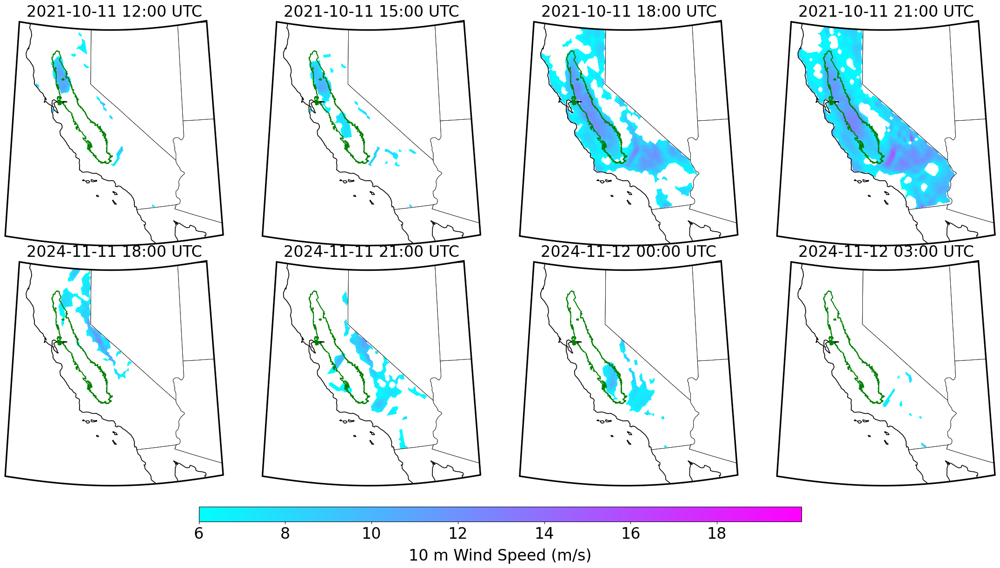

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

import geopandas as gpd
from herbie import Herbie
from shapely.vectorized import contains
import metpy.calc as mpcalc

# -----------------------------------------------------------------------------
# 0) Load Central Valley counties (for overlay) and CA boundary (for masking)
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)
shpfile = shapereader.natural_earth(
    resolution="50m", category="cultural",
    name="admin_1_states_provinces"
)
reader  = shapereader.Reader(shpfile)
CA_geom = next(rec.geometry for rec in reader.records()
               if rec.attributes["name"] == "California")

# -----------------------------------------------------------------------------
# 1) Define your two event lists
# -----------------------------------------------------------------------------
times_2021 = ["2021-10-11 12:00","2021-10-11 15:00",
               "2021-10-11 18:00","2021-10-11 21:00"]
times_2024 = ["2024-11-11 18:00","2024-11-11 21:00",
               "2024-11-12 00:00","2024-11-12 03:00"]

data_events = []
gmin, gmax = np.inf, -np.inf

# -----------------------------------------------------------------------------
# 2) Fetch & compute 10 m wind speed, track global min/max
# -----------------------------------------------------------------------------
for label, times in [("Oct 2021", times_2021), ("Nov 2024", times_2024)]:
    arrs = []
    for ts in times:
        ds_uv = Herbie(ts, model="rap", product="awp130pgrb") \
                  .xarray("[UV]GRD:10 m above ground:")
        u10   = ds_uv["u10"].metpy.quantify()
        v10   = ds_uv["v10"].metpy.quantify()
        wspd  = mpcalc.wind_speed(u10, v10).metpy.dequantify().values

        lons = ds_uv["longitude"].values
        lats = ds_uv["latitude"].values
        if lons.ndim == 1 and lats.ndim == 1:
            lon2d, lat2d = np.meshgrid(lons, lats)
        else:
            lon2d, lat2d = lons, lats

        gmin = min(gmin, float(np.nanmin(wspd)))
        gmax = max(gmax, float(np.nanmax(wspd)))

        arrs.append({
            "ts":    ts,
            "wspd":  wspd,
            "lon2d": lon2d,
            "lat2d": lat2d
        })
    data_events.append((label, arrs))

# -----------------------------------------------------------------------------
# 3) Prepare colormap & levels starting at 6 m/s
# -----------------------------------------------------------------------------
threshold = 6.0
norm      = Normalize(vmin=threshold, vmax=gmax)
cmap      = plt.get_cmap("cool").copy()
cmap.set_bad("white")
levels    = np.linspace(threshold, gmax, 21)

# -----------------------------------------------------------------------------
# 4) Build the “pinched” CA frame
# -----------------------------------------------------------------------------
lon0, lon1, lat0, lat1 = -125, -112, 31, 42.1
n = 200
f = np.linspace(0, 1, n)
amp_top, amp_bot = 0.28, 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top*np.sin(np.pi*f)))
right  = np.column_stack(([lon1]*n,                 np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot*np.sin(np.pi*f)))
left   = np.column_stack(([lon0]*n,                 np.linspace(lat0, lat1, n)))
pts    = np.vstack([top, right, bottom, left, top[:1]])
codes  = [Path.MOVETO] + [Path.LINETO]*(len(pts)-2) + [Path.CLOSEPOLY]
box_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black"):
    ax.set_boundary(box_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        box_path, transform=ccrs.PlateCarree(),
        facecolor="none", edgecolor=edgecolor,
        linewidth=linewidth, zorder=5
    ))

# -----------------------------------------------------------------------------
# 5) Plot panels (2×4 grid), masking outside CA & thresholding <6 m/s
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-119, central_latitude=37,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(2, 4, figsize=(32, 12),
                        subplot_kw={"projection": proj})
plt.subplots_adjust(wspace=0.01, hspace=0.11,
                    left=0.01, right=0.7, top=1, bottom=0.1)

for i, (_, arrs) in enumerate(data_events):
    for j, dat in enumerate(arrs):
        ax = axs[i, j]
        clip_to_curve(ax)
        ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())

        # coastlines & borders
        ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1.2, zorder=2)
        ax.add_feature(cfeature.BORDERS,                lw=0.5, zorder=2)
        ax.add_feature(cfeature.STATES.with_scale("50m"), lw=0.5, zorder=2)

        # copy arrays
        lon2d = dat["lon2d"].copy()
        lat2d = dat["lat2d"].copy()
        wspd  = dat["wspd"].copy()

        # remap if needed
        if lon2d.max() > 180:
            lon2d = np.where(lon2d > 180, lon2d - 360, lon2d)

        # mask outside California
        inside_ca = contains(CA_geom, lon2d, lat2d)
        wspd[~inside_ca] = np.nan

        # mask below threshold
        wspd[wspd < threshold] = np.nan

        # filled contours
        cf = ax.contourf(
            lon2d, lat2d, wspd,
            levels=levels, norm=norm, cmap=cmap,
            extend="neither", transform=ccrs.PlateCarree(),
            zorder=1
        )

        # white ocean & lakes
        ax.add_feature(cfeature.OCEAN.with_scale("50m"), facecolor="white", zorder=0)
        ax.add_feature(cfeature.LAKES.with_scale("50m"), facecolor="white", zorder=0)

        # overlay CV in green
        ax.add_geometries(
            cv.geometry, crs=ccrs.PlateCarree(),
            edgecolor="green", facecolor="none",
            linewidth=1.5, zorder=4
        )

        ax.set_title(f"{dat['ts']} UTC", fontsize=24, pad=6)
        ax.tick_params(labelsize=20)

# -----------------------------------------------------------------------------
# 6) Shared horizontal colorbar
# -----------------------------------------------------------------------------
sm = ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = fig.colorbar(
    sm, ax=axs.ravel().tolist(),
    orientation="horizontal",
    fraction=0.03, pad=0.06,
    aspect=40, extend="neither"
)
cbar.set_label("10 m Wind Speed (m/s)", fontsize=24, labelpad=10)
cbar.ax.tick_params(labelsize=24)

# -----------------------------------------------------------------------------
# 7) Save & show
# -----------------------------------------------------------------------------
plt.savefig(
    "rap_10m_wind_ca6ms_threshold.png",
    dpi=500, bbox_inches="tight"
)
plt.show()


/var/folders/c8/bldvw2mx0q1fbjk1dlj5dypr0000gn/T/ipykernel_16196/3366061634.py:151: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])


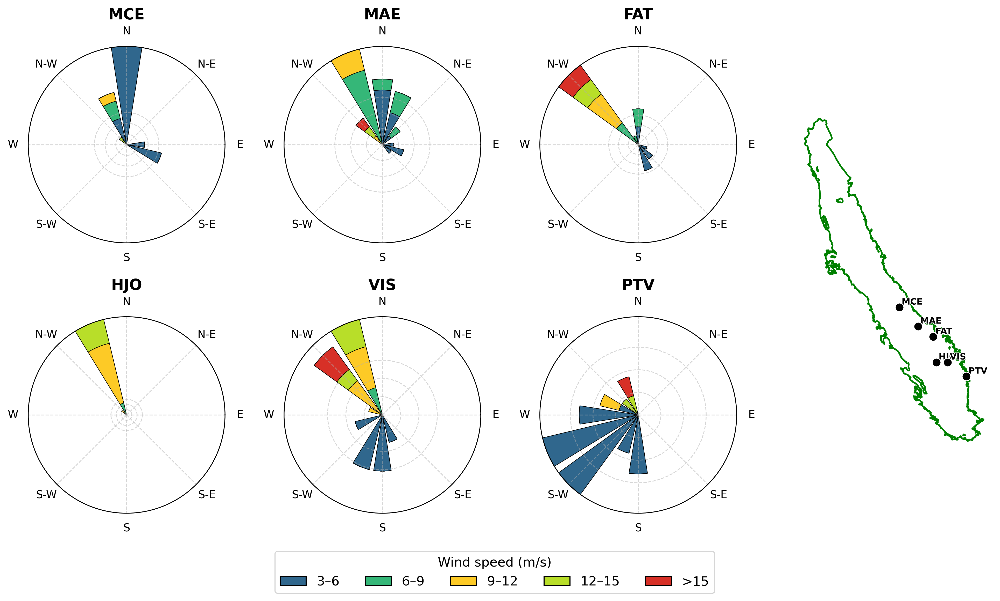

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from windrose import WindroseAxes
import requests, io
from datetime import datetime
import geopandas as gpd
import matplotlib.patheffects as patheffects
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec

# ─── Style tweaks ──────────────────────────────────────────────────────────
plt.rcParams.update({
    'font.family':     'sans-serif',
    'font.sans-serif': ['DejaVu Sans'],
    'font.size':       12,
    'axes.titlesize':  14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'figure.dpi':      300,
})

def download_asos_data(station_id, year):
    """
    Download ASOS data for a single station on 11 November of `year`.
    """
    base_url = "https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py/"
    params = {
        'station': station_id,
        'data':    'drct,sknt,vsby',
        'year1':   year, 'month1': '11', 'day1': '11',
        'year2':   year, 'month2': '11', 'day2': '11',
        'tz':      'UTC',
        'format':  'comma',
        'direct':  'yes'
    }
    resp = requests.get(base_url, params=params)
    resp.raise_for_status()
    return pd.read_csv(io.StringIO(resp.text), skiprows=5)

# ─── Step 1: Download & assemble for 11 Nov 2024 ─────────────────────────────
stations = ["MCE", "MAE", "FAT", "HJO", "VIS", "PTV"]
dfs = []
for st in stations:
    df = download_asos_data(st, 2024)
    df['station'] = st
    dfs.append(df)
asos = pd.concat(dfs, ignore_index=True)

# ─── Step 2: Rename and convert to numeric ──────────────────────────────────
asos.rename(columns={
    'drct': 'wind_direction',
    'sknt': 'wind_speed_knots',
    'vsby': 'visibility_miles'
}, inplace=True)

asos['wind_direction'] = pd.to_numeric(asos['wind_direction'], errors='coerce')
asos['wind_speed_mps']  = pd.to_numeric(asos['wind_speed_knots'], errors='coerce') * 0.514444
asos['valid']           = pd.to_datetime(asos['valid'], errors='coerce')
asos = asos.dropna(subset=['wind_direction', 'wind_speed_mps'])

# ─── Step 3: Filter to 11 Nov 2024 between 20–23 UTC ────────────────────────
event_date = datetime(2024, 11, 11).date()
mask_date = (asos.valid.dt.date == event_date)
mask_time = asos.valid.dt.hour.between(20, 23)
df_event = asos[mask_date & mask_time]

# ─── Exclude winds below 3 m/s so first bin (3) ≤ min(speed) ────────────────
df_event = df_event[df_event.wind_speed_mps >= 3]

# ─── Step 4: Define bins & colormap ─────────────────────────────────────────
bins       = np.array([3, 6, 9, 12, 15, 99])  # 3–6, 6–9, 9–12, 12–15, >15
colors     = [
    '#30678D',  # 3–6
    '#35B778',  # 6–9
    '#FDCA26',  # 9–12
    '#B8DE29',  # 12–15
    '#D73027'   # >15 (distinct red)
]
cmap       = ListedColormap(colors)
bin_labels = ["3–6", "6–9", "9–12", "12–15", ">15"]

# ─── Step 5: Set up figure + GridSpec ──────────────────────────────────────
fig = plt.figure(figsize=(16, 8))
gs  = GridSpec(2, 4, figure=fig, wspace=0.3, hspace=0.3)

# ─── Step 6: Plot wind‐roses for each station ───────────────────────────────
for idx, st in enumerate(stations):
    row, col = divmod(idx, 3)
    ax = fig.add_subplot(gs[row, col], projection='windrose')
    sub = df_event[df_event.station == st]
    ax.bar(
        sub.wind_direction,
        sub.wind_speed_mps,
        normed=True,
        bins=bins,
        cmap=cmap,
        edgecolor='black',
        lw=0.5
    )
    ax.set_title(st, fontweight='bold')
    ax.set_yticks([5, 10, 15])
    ax.yaxis.grid(True, linestyle='--', alpha=0.5)
    ax.xaxis.grid(True, linestyle='--', alpha=0.5)

# ─── Step 7: Inset map of Central Valley & stations ────────────────────────
inset_ax = fig.add_subplot(gs[:, 3])
#cv = gpd.read_file("central_valley_counties.shp")
cv1 = gpd.read_file("california_shapefile.shp").to_crs(epsg=4326)
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)
cv.boundary.plot(ax=inset_ax, edgecolor='green', linewidth=1.5)
#cv1.boundary.plot(ax=inset_ax, edgecolor='black', linewidth=1.5)

coords = {
    "MCE": (-120.4826, 37.3026),
    "MAE": (-120.0607, 36.9613),
    "FAT": (-119.7181, 36.7762),
    "HJO": (-119.6454, 36.3199),
    "VIS": (-119.3916, 36.3181),
    "PTV": (-118.9712, 36.0663),
}

for st, (lon, lat) in coords.items():
    inset_ax.plot(lon, lat, 'o', ms=8, color='black', mec='white', mew=0.8, zorder=5)
    inset_ax.text(
        lon + 0.05, lat + 0.05, st,
        fontsize=8, fontweight='bold',
        path_effects=[patheffects.withStroke(linewidth=1.5, foreground="white")]
    )

inset_ax.set_xticks([])
inset_ax.set_yticks([])
for spine in inset_ax.spines.values():
    spine.set_visible(False)

# ─── Step 8: Shared legend at the bottom ──────────────────────────────────
patches = [
    mpatches.Patch(facecolor=colors[i], edgecolor='black', label=bin_labels[i])
    for i in range(len(bin_labels))
]
fig.legend(
    handles=patches,
    title="Wind speed (m/s)",
    loc='lower center',
    ncol=len(bin_labels),
    frameon=True,
    bbox_to_anchor=(0.5, -0.02)
)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.savefig("2024-figg1.png", dpi=500, bbox_inches="tight")
plt.show()


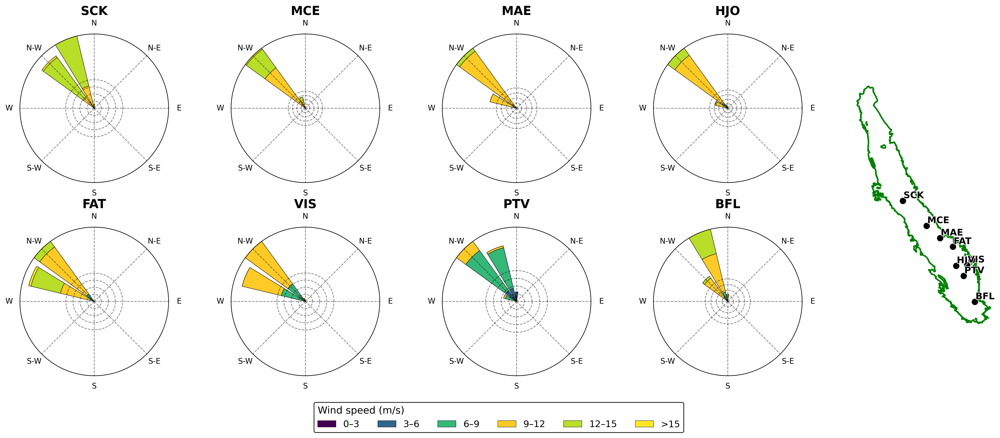

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from windrose import WindroseAxes
import requests
from datetime import datetime
import io
import geopandas as gpd
import matplotlib.patheffects as patheffects
from matplotlib.colors import ListedColormap
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec

# ─── Step 0: Global Style Tweaks ─────────────────────────────────────────────
plt.rcParams.update({
    'font.family':        'sans-serif',
    'font.sans-serif':    ['DejaVu Sans'],
    'font.size':          12,
    'axes.titlesize':     14,
    'xtick.labelsize':    10,
    'ytick.labelsize':    10,
    'axes.linewidth':     0.8,
    'figure.dpi':         300,
})

def download_asos_data(station_id, year):
    """
    Download ASOS data for a single station on 11 October of `year` from ISU Mesonet.
    Returns a DataFrame or an empty DataFrame if the request fails.
    """
    base_url = "https://mesonet.agron.iastate.edu/cgi-bin/request/asos.py/"
    params = {
        'station': station_id,
        'data':    'sped,drct,vsby,sknt,relh,metar,wxcodes',
        'year1':   year, 'month1': '10', 'day1': '11',
        'year2':   year, 'month2': '10', 'day2': '11',
        'tz':      'UTC',
        'format':  'comma',
        'direct':  'yes'
    }
    resp = requests.get(base_url, params=params)
    if resp.status_code == 200:
        return pd.read_csv(io.StringIO(resp.text), skiprows=5)
    else:
        print(f"Failed to download {station_id}")
        return pd.DataFrame()

# ─── Step 1: Restrict to eight stations and load data ─────────────────────────
stations = ["SCK", "MCE", "MAE", "HJO", "FAT", "VIS", "PTV", "BFL"]

dfs = []
for st in stations:
    df = download_asos_data(st, 2021)
    if not df.empty:
        df['station'] = st
        dfs.append(df)
asos = pd.concat(dfs, ignore_index=True)

# Rename and convert units
asos.rename(columns={
    'drct': 'wind_direction',
    'sknt': 'wind_speed_knots',
    'vsby': 'visibility_miles'
}, inplace=True)
asos['wind_speed_mps'] = (
    pd.to_numeric(asos['wind_speed_knots'], errors='coerce') * 0.514444
)
asos['wind_direction'] = pd.to_numeric(asos['wind_direction'], errors='coerce')
asos['valid'] = pd.to_datetime(asos['valid'], errors='coerce')

# Filter 11 Oct 2021, 18–23 UTC
mask_date = (asos['valid'].dt.date == datetime(2021,10,11).date())
mask_time = asos['valid'].dt.hour.between(18, 23)
data = asos[mask_date & mask_time].dropna(
    subset=['wind_speed_mps','wind_direction']
)

# ─── Step 2: North→South ordering of those eight stations ───────────────────
lats = {
    "SCK": 37.9133,
    "MCE": 37.3539,
    "MAE": 36.9610,
    "HJO": 36.9042,
    "FAT": 36.7762,
    # Corrected VIS coordinates:
    "VIS": 36.3302,
    "PTV": 36.0660,
    "BFL": 35.4333
}
order = [
    s for s in sorted(lats, key=lambda x: lats[x], reverse=True)
    if s in data['station'].unique()
]

# ─── Step 3: ColorMap + Bins ─────────────────────────────────────────────────
bins = np.array([0, 3, 6, 9, 12, 15, 99])
bin_labels = ["0–3", "3–6", "6–9", "9–12", "12–15", ">15"]

base_colors = [
    '#440154',  # deep purple
    '#30678D',  # medium blue
    '#35B778',  # greenish
    '#FDCA26',  # golden‐yellow
    '#B8DE29',  # lighter green
    '#FDE725'   # very light yellow
]
cmap = ListedColormap(base_colors)

# ─── Step 4: Set up a 2×5 GridSpec ───────────────────────────────────────────
fig = plt.figure(figsize=(20, 8))
gs = GridSpec(nrows=2, ncols=5, figure=fig,
              width_ratios=[1,1,1,1,0.8],
              hspace=0.3, wspace=0.2)

# ─── Step 5: Draw the 8 Wind‐Roses in the first 2×4 slots ───────────────────
for idx, st in enumerate(order):
    row = idx // 4
    col = idx % 4
    ax = fig.add_subplot(gs[row, col], projection='windrose')
    sub = data[data['station'] == st]
    if sub.empty:
        ax.set_title(f"{st}\n(no obs)", fontsize=14)
    else:
        ax.bar(
            sub['wind_direction'],
            sub['wind_speed_mps'],
            normed=True,
            bins=bins,
            cmap=cmap,
            edgecolor='black',
            lw=0.5
        )
        ax.set_title(st, fontsize=16, fontweight='bold')
        ax.set_yticks([5, 10, 15, 20])
        ax.yaxis.grid(True, linestyle='--', linewidth=0.9, color='black', alpha=0.5)
        ax.xaxis.grid(True, linestyle='--', linewidth=0.9, color='black', alpha=0.5)

# Remove any extra axes (beyond 8)
for ax in fig.axes:
    if not isinstance(ax, WindroseAxes):
        continue
# (No need to explicitly delete here, GridSpec usage already allocates exactly 8 windrose slots)

# ─── Step 6: Reserve the right‐most column (both rows) for the inset map ─────
inset_ax = fig.add_subplot(gs[:, 4])  # “all rows in column 4 (0‐based)”

# Load the Central Valley counties shapefile
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)

# Plot only the Central Valley boundary (bold red)
cv.boundary.plot(ax=inset_ax, edgecolor='green', linewidth=2.0)

# Corrected station coordinates (including VIS)
df_coords = pd.DataFrame({
    'station': ["SCK",  "MCE",   "MAE",   "HJO",   "FAT",    "VIS",    "PTV",   "BFL"],
    'lat':     [37.89417, 37.28603, 36.98486, 36.31139, 36.7762, 36.3302, 36.0660, 35.4333],
    'lon':     [-121.2383, -120.5179, -120.1107, -119.6232, -119.7194, -119.2921, -119.3929, -119.0542]
})
gdf_st = gpd.GeoDataFrame(
    df_coords,
    geometry=gpd.points_from_xy(df_coords.lon, df_coords.lat),
    crs="EPSG:4326"
)

# Plot station points as solid black circles with white outline
gdf_st.plot(
    ax=inset_ax,
    color='black',
    edgecolor='white',
    linewidth=0.6,
    markersize=80,
    zorder=3
)

for _, row in df_coords.iterrows():
    inset_ax.text(
        row.lon + 0.02,
        row.lat + 0.02,
        row.station,
        fontsize=12,
        fontweight='bold',
        ha='left',
        va='bottom',
        zorder=4,
        path_effects=[patheffects.withStroke(linewidth=1.5, foreground="white")]
    )

# Expand the view slightly beyond the CV bounding box so no station sits on the edge
minx, miny, maxx, maxy = cv.total_bounds
dx = (maxx - minx) * 0.05
dy = (maxy - miny) * 0.05
inset_ax.set_xlim(minx - dx, maxx + 0.05)   # extend slightly east
inset_ax.set_ylim(miny - dy, maxy + dy)

# Remove ticks & spines for a clean look
inset_ax.set_xticks([])
inset_ax.set_yticks([])
for spine in inset_ax.spines.values():
    spine.set_visible(False)
inset_ax.set_title("", fontsize=14, fontweight='bold')

# ─── Step 7: Create a single legend at the very bottom ───────────────────────
patches = []
for i, lbl in enumerate(bin_labels):
    patches.append(
        mpatches.Patch(
            facecolor=base_colors[i],
            edgecolor='black',
            linewidth=0.4,
            label=lbl
        )
    )

# “lower center” with a negative y offset so it sits just below the grid
leg = fig.legend(
    handles=patches,
    title="Wind speed (m/s)",
    loc='lower center',
    ncol=len(bin_labels),
    frameon=True,
    framealpha=0.9,
    edgecolor='black',
    fontsize=12,
    title_fontsize=13,
    bbox_to_anchor=(0.5, -0.02)
)
leg._legend_box.align = "left"

# ─── Step 8: Final layout & save ─────────────────────────────────────────────
fig.suptitle(
    "",  # Add a suptitle here if you want
    fontsize=18,
    fontweight='bold',
    y=1.02
)

# Leave enough bottom margin for the legend
plt.subplots_adjust(
    top=0.90,
    bottom=0.12,
    left=0.05,
    right=0.95
)

plt.savefig("2021-figg1.png", dpi=500, bbox_inches="tight")
plt.show()


✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 12:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 15:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2021-Oct-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 18:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-11 21:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 00:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws
✅ Found ┊ model=rap ┊ product=awp130pgrb ┊ 2024-Nov-12 03:00 UTC F00 ┊ GRIB2 @ aws ┊ IDX @ aws


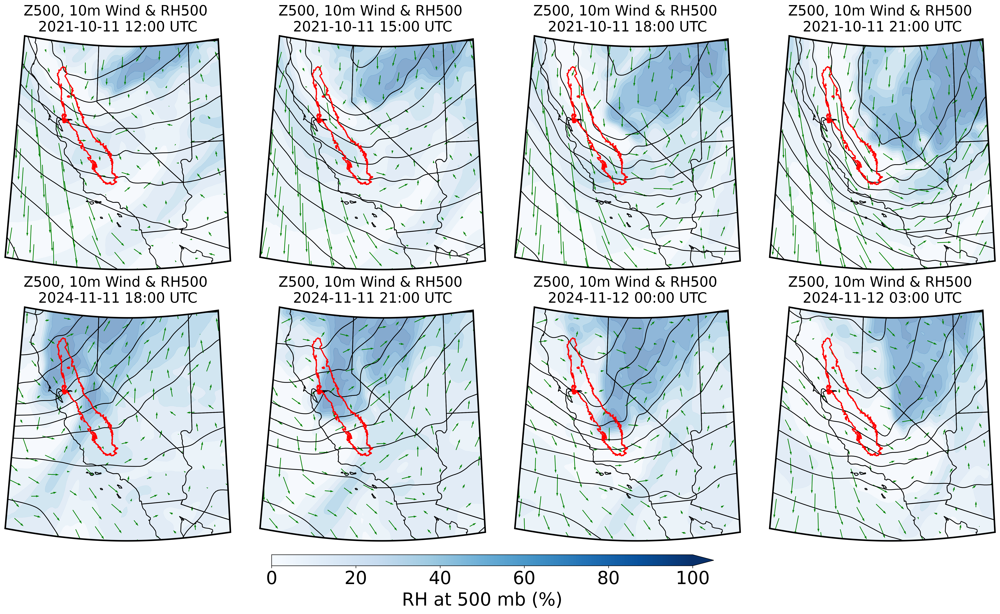

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.path import Path
from matplotlib.patches import PathPatch
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
import geopandas as gpd
from herbie import Herbie
import metpy.calc as mpcalc

# -----------------------------------------------------------------------------
# 0) Load Central Valley shapefile
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Define two event time groups
# -----------------------------------------------------------------------------
times_2021 = [
    "2021-10-11 12:00",
    "2021-10-11 15:00",
    "2021-10-11 18:00",
    "2021-10-11 21:00",
]
times_2024 = [
    "2024-11-11 18:00",
    "2024-11-11 21:00",
    "2024-11-12 00:00",
    "2024-11-12 03:00",
]

# -----------------------------------------------------------------------------
# 2) Fetch Z500, 10 m winds & RH500 for both event sets
# -----------------------------------------------------------------------------
data_events = []
for label, times in [("Oct 2021", times_2021), ("Nov 2024", times_2024)]:
    arrs = []
    for ts in times:
        H    = Herbie(ts, model="rap", product="awp130pgrb")
        # Z500
        ds_z = H.xarray(":HGT:500 mb:")
        z500 = ds_z["gh"].metpy.quantify().metpy.dequantify().values
        # 10 m winds
        ds_uv = H.xarray(":[UV]GRD:10 m above ground:")
        u10   = ds_uv["u10"].metpy.quantify().metpy.dequantify().values
        v10   = ds_uv["v10"].metpy.quantify().metpy.dequantify().values
        # RH500
        ds_rh = H.xarray(":RH:500 mb:")
        rh500 = ds_rh["r"].metpy.quantify().metpy.dequantify().values
        # coords
        lons  = ds_z["longitude"].values
        lats  = ds_z["latitude"].values

        arrs.append({
            "ts": ts, "z500": z500,
            "u10": u10, "v10": v10,
            "rh": rh500,
            "lons": lons, "lats": lats
        })
    data_events.append((label, arrs))

# -----------------------------------------------------------------------------
# 3) Define concave “pinched” California frame
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,    42.1
n = 200; f = np.linspace(0, 1, n)
amp_top, amp_bot = 0.28, 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top*np.sin(np.pi*f)))
right  = np.column_stack(([lon1]*n, np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot*np.sin(np.pi*f)))
left   = np.column_stack(([lon0]*n, np.linspace(lat0, lat1, n)))

pts = np.vstack([top, right, bottom, left, top[:1]])
codes = [Path.MOVETO] + [Path.LINETO]*(len(pts)-2) + [Path.CLOSEPOLY]
box_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(box_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        box_path, transform=ccrs.PlateCarree(),
        facecolor="none", edgecolor=edgecolor,
        linewidth=linewidth, zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 4) Plot 2×4 panel: first row Oct 2021, second row Nov 2024
# -----------------------------------------------------------------------------
proj = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    2, 4, figsize=(32, 12),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(wspace=0.01, hspace=0.2,
                    left=0.01, right=0.7, top=1, bottom=0.1)

# fixed RH levels
rh_levels = np.arange(0, 101, 10)

for i, (_, arrs) in enumerate(data_events):
    for j, dat in enumerate(arrs):
        ax = axs[i, j]
        clip_to_curve(ax)
        ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())
        ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1.2)
        ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=1.2)
        ax.add_feature(cfeature.BORDERS, linewidth=1.2)

        # RH500 shading
        ax.contourf(
            dat["lons"], dat["lats"], dat["rh"],
            levels=rh_levels, cmap="Blues", alpha=0.5,
            transform=ccrs.PlateCarree(), extend="both"
        )
        # Z500 contours
        zmin = np.nanmin(dat["z500"])//60*60
        zmax = zmin + 60* (np.nanmax(dat["z500"])//60 - zmin//60 + 1)
        levs_z = np.arange(zmin, zmax+1, 60)
        ax.contour(
            dat["lons"], dat["lats"], dat["z500"],
            levels=levs_z, colors="black", linewidths=1.2,
            transform=ccrs.PlateCarree()
        )
        # 3) 10 m wind quivers (green) every 12th grid point
        step = 8
        ax.quiver(
            dat["lons"][::step, ::step],
            dat["lats"][::step, ::step],
            dat["u10"][::step, ::step],
            dat["v10"][::step, ::step],
            color="green",
            transform=ccrs.PlateCarree(),
            scale=120, width=0.003
        )
        # CV boundary
        ax.add_geometries(
            cv.geometry, crs=ccrs.PlateCarree(),
            edgecolor="red", facecolor="none",
            linewidth=1.8, zorder=5
        )
        # ** title now *only* the UTC timestamp **
        ax.set_title(f"Z500, 10m Wind & RH500 \n{dat['ts']} UTC", fontsize=22, pad=6)
        ax.tick_params(labelsize=14)

# ---- shared RH colorbar ----
cax = fig.add_axes([0.20, 0.04, 0.3, 0.02])
sm = ScalarMappable(cmap="Blues", norm=Normalize(vmin=0, vmax=100))
sm.set_array([])
cbar = fig.colorbar(sm, cax=cax, orientation="horizontal", extend="max")
cbar.set_label("RH at 500 mb (%)", fontsize=28, labelpad=6)
cbar.ax.tick_params(labelsize=28)

plt.savefig("fig1-rh500.png",
            dpi=300, bbox_inches="tight")
plt.show()


In [ ]:
import os

os.chdir('/Users/precious/Downloads')

import numpy as np
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader

from matplotlib.path import Path
from matplotlib.patches import PathPatch

import geopandas as gpd
from shapely.vectorized import contains

from goes2go import GOES

# -----------------------------------------------------------------------------
# 0) Load Central Valley alluvial boundary
# -----------------------------------------------------------------------------
cv = gpd.read_file("central_valley_alluvial_boundary_usgs.shp").to_crs(epsg=4326)

# -----------------------------------------------------------------------------
# 1) Load California boundary from Natural Earth
# -----------------------------------------------------------------------------
shpfile = shapereader.natural_earth(
    resolution="50m", category="cultural",
    name="admin_1_states_provinces"
)
reader = shapereader.Reader(shpfile)
CA_geom = None
for rec in reader.records():
    if rec.attributes["name"] == "California":
        CA_geom = rec.geometry
        break
if CA_geom is None:
    raise RuntimeError("Could not find California geometry")

# -----------------------------------------------------------------------------
# 2) Build the “pinched” California frame
# -----------------------------------------------------------------------------
lon0, lon1 = -125, -112
lat0, lat1 =   31,   42.1
n = 200
f          = np.linspace(0, 1, n)
amp_top    = 0.28
amp_bot    = 0.32

top    = np.column_stack((np.linspace(lon0, lon1, n), lat1 - amp_top * np.sin(np.pi * f)))
right  = np.column_stack(([lon1]*n,     np.linspace(lat1, lat0, n)))
bottom = np.column_stack((np.linspace(lon1, lon0, n), lat0 - amp_bot * np.sin(np.pi * f)))
left   = np.column_stack(([lon0]*n,     np.linspace(lat0, lat1, n)))
pts    = np.vstack([top, right, bottom, left, top[:1]])
codes  = [Path.MOVETO] + [Path.LINETO] * (len(pts)-2) + [Path.CLOSEPOLY]
frame_path = Path(pts, codes)

def clip_to_curve(ax, linewidth=4, edgecolor="black", zorder=10):
    ax.set_boundary(frame_path, transform=ccrs.PlateCarree())
    ax.patch.set_facecolor("none")
    ax.add_patch(PathPatch(
        frame_path, transform=ccrs.PlateCarree(),
        facecolor="none", edgecolor=edgecolor,
        linewidth=linewidth, zorder=zorder
    ))

# -----------------------------------------------------------------------------
# 3) Define times & projection
# -----------------------------------------------------------------------------
times = ["2021-10-11 15:00:00", "2021-10-11 16:00:00", "2021-10-11 17:00:00"]
proj  = ccrs.LambertConformal(
    central_longitude=-117, central_latitude=35,
    standard_parallels=(33, 45)
)
fig, axs = plt.subplots(
    1, 3, figsize=(18, 7),
    subplot_kw={"projection": proj}
)
plt.subplots_adjust(wspace=0.03, left=0.02, right=0.98, top=0.90, bottom=0.08)

# -----------------------------------------------------------------------------
# 4) Loop: mask Dust RGB and plot
# -----------------------------------------------------------------------------
for ax, ts in zip(axs, times):
    # a) Set extent & clip frame
    ax.set_extent([lon0, lon1, lat0, lat1], ccrs.PlateCarree())
    clip_to_curve(ax)

    # b) Fetch GOES Dust RGB
    sat  = GOES(satellite=17).nearesttime(ts)

    ds   = sat

    dust = ds.rgb.Dust().copy()

    # c) Invert GOES grid → lon2d, lat2d
    h       = ds["goes_imager_projection"].perspective_point_height
    x       = ds["x"].values * h
    y       = ds["y"].values * h
    X2d, Y2d = np.meshgrid(x, y)
    geo_pts  = ccrs.PlateCarree().transform_points(ds.rgb.crs, X2d, Y2d)
    lon2d    = geo_pts[...,0]
    lat2d    = geo_pts[...,1]

    # d) Mask outside California
    mask_ca = contains(CA_geom, lon2d, lat2d)
    for k in range(3):
        dust[..., k] = np.where(mask_ca, dust[..., k], np.nan)

    # e) Plot masked Dust RGB
    im_kwargs = ds.rgb.imshow_kwargs.copy()
    im_kwargs.pop("interpolation", None)
    im_kwargs.pop("resample", None)
    ax.imshow(
        dust,
        interpolation="bicubic",
        resample=True,
        **im_kwargs
    )

    # f) Add geographic features & outlines
    ax.add_feature(cfeature.OCEAN.with_scale("50m"), facecolor="white", zorder=1)
    ax.add_feature(cfeature.LAKES.with_scale("50m"), facecolor="lightgrey", zorder=1)
    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=1, zorder=2)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=1, zorder=2)
    ax.add_geometries([CA_geom], crs=ccrs.PlateCarree(),
                      facecolor="none", edgecolor="black", linewidth=2, zorder=3)
    ax.add_geometries(cv.geometry, crs=ccrs.PlateCarree(),
                      facecolor="none", edgecolor="green", linewidth=1.5, zorder=4)

    # g) Title
    ax.set_title(f"GOES Dust RGB\n{ts[:-3]} UTC", fontsize=22)

# -----------------------------------------------------------------------------
# 5) Save & show
# -----------------------------------------------------------------------------
plt.savefig("g1.png", dpi=500, bbox_inches="tight")
plt.show()



📦 Finished downloading [1] files to [/Users/precious/data/noaa-goes17/ABI-L2-MCMIPC].
📖💽 Reading (1/1) file from LOCAL COPY [/Users/precious/data/noaa-goes17/ABI-L2-MCMIPC/2021/284/15/OR_ABI-L2-MCMIPC-M6_G17_s20212841501176_e20212841503549_c20212841504038.nc]. 